In [1]:
from google.colab.patches import cv2_imshow

In [2]:
#import libraries
import cv2

import numpy as np
import os

from IPython.display import display
from PIL import Image

import matplotlib.pyplot as plt
%matplotlib inline

from time import time

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Working with images
Images are made up of a bunch of pixels. Each pixel has attributes such as location, color, and distance to other pixels.

There are numerous methods to display images in Python.

OpenCV for Python is an opensource library popular in the Machine Learning community. More info can be found at https://pypi.org/project/opencv-python/.  
Images in OpenCV are primarily numpy arrays.

The code below below retrieves the image from the images folder and displays in a popup window.  Click on the image and then press any key on your keyboard to close it.

### Note for Jetson Nano

This method works fine for viewing images locally but when viewing through a Jupyter Notebook on the Nano, you will not be able to view the image in  popup window. The workaround is to combine cv2 with iPython, Matplotlib, or ipywidget to render images or vidoes.

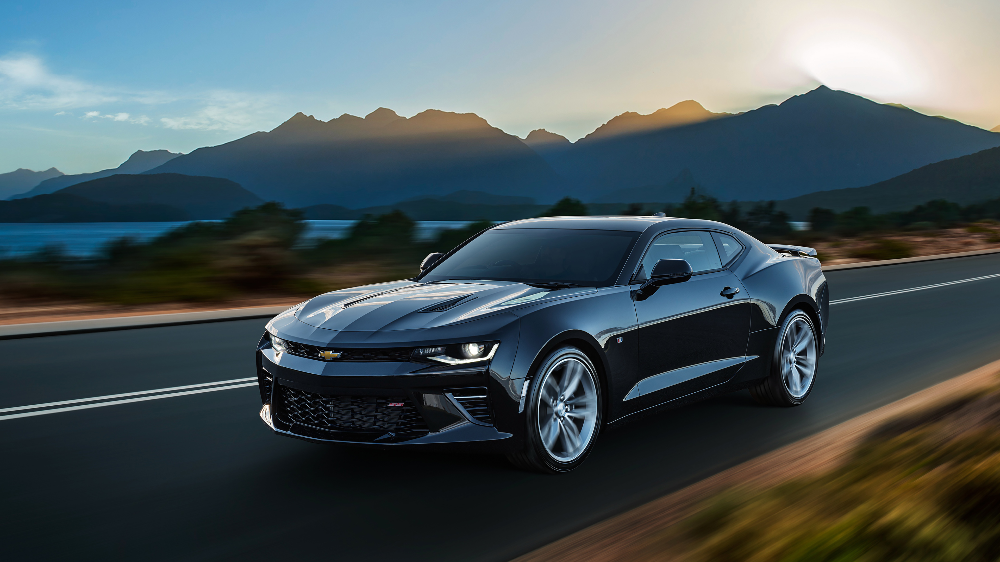

CPU times: user 2.4 s, sys: 46.5 ms, total: 2.45 s
Wall time: 4.43 s


In [4]:
#Display an image locally in a popup window using Cv2 imshow
%%time
img3 = cv2.imread('/content/drive/My Drive/instructions/chevrolet_camaro_ss_2018_4k-HD.jpg')
cv2_imshow(img3)
cv2.waitKey(0)
cv2.destroyAllWindows()

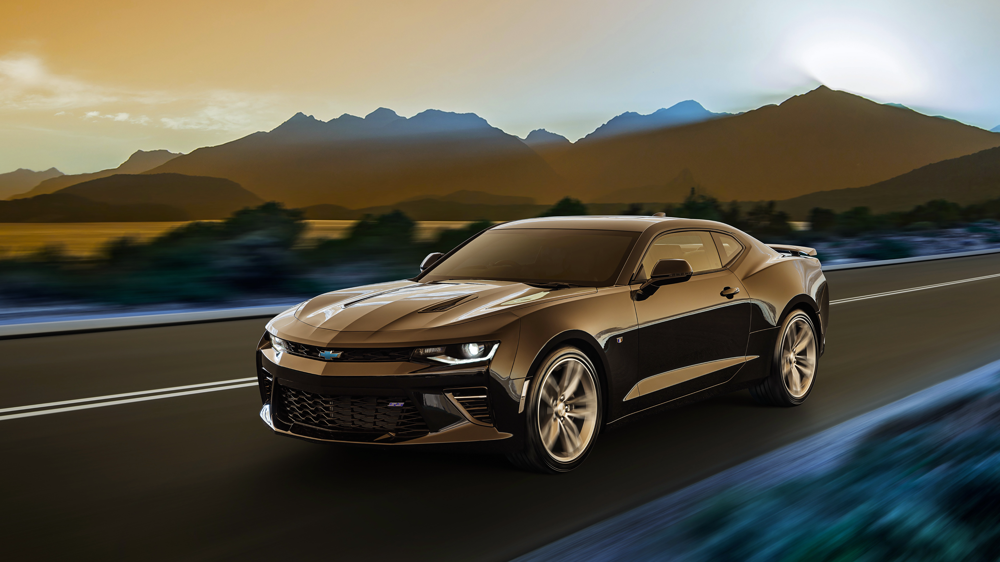

CPU times: user 2.61 s, sys: 153 µs, total: 2.61 s
Wall time: 2.69 s


In [5]:
#Display an image using iPython dislay
#import libraries
%%time
import cv2

import numpy as np
import os

from IPython.display import display
from PIL import Image
img3 = cv2.imread('/content/drive/My Drive/instructions/chevrolet_camaro_ss_2018_4k-HD.jpg')
display(Image.fromarray(img3))

The next two blocks create a random image, writes them to file and displays them

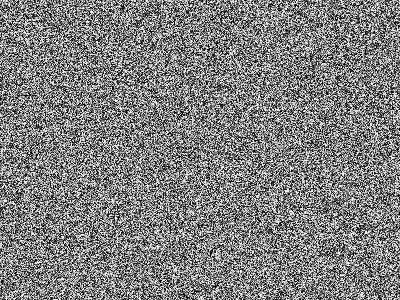

CPU times: user 55.5 ms, sys: 0 ns, total: 55.5 ms
Wall time: 1.01 s


In [6]:
# Make an array of 120,000 random bytes.
%%time
randomByteArray = bytearray(os.urandom(120000))
flatNumpyArray = np.array(randomByteArray)

# Convert the array to make a 400x300 grayscale image.
grayImage = flatNumpyArray.reshape(300, 400)
cv2.imwrite('/content/drive/My Drive/instructions/RandomGray.png', grayImage)
grayImage3 = cv2.imread('/content/drive/My Drive/instructions/RandomGray.png')

display(Image.fromarray(grayImage3))

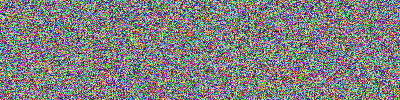

CPU times: user 18.5 ms, sys: 0 ns, total: 18.5 ms
Wall time: 568 ms


In [7]:
# Convert the array to make a 400x100 color image and write to file.
%%time
bgrImage = flatNumpyArray.reshape(100, 400, 3)
img = cv2.imwrite('/content/drive/My Drive/instructions/RandomColor.png', bgrImage)
#read local image
img2 = cv2.imread('/content/drive/My Drive/instructions/RandomColor.png') # with the OpenCV function imread(), the order of colors is BGR (blue, green, red).
display(Image.fromarray(img2))

Matplotlib can also be used to display images with notebook along with the %matplotlib inline decorator
Below is an example showing the same image using matplotlib

In [8]:
import matplotlib.pyplot as plt

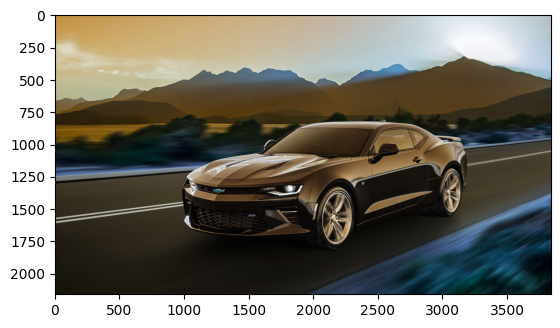

In [9]:
plt.imshow(img3)
plt.show()

## Matplotlib
And like iPython display, you can combine cv2 operations and use  Matplotlib to show the image.

In this next codeblock, we use cv2 to transform the image and then show it as a plot. We also remoted the ticks on the x and y axis.

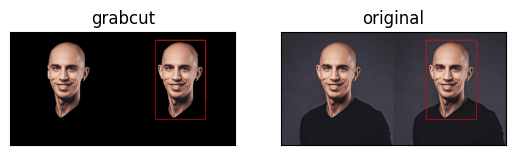

CPU times: user 687 ms, sys: 94.5 ms, total: 782 ms
Wall time: 1.23 s


In [10]:
%%time
original = cv2.imread('/content/drive/My Drive/instructions/download.jpeg')
img = original.copy()
mask = np.zeros(img.shape[:2], np.uint8)

bgdModel = np.zeros((1, 65), np.float64)
fgdModel = np.zeros((1, 65), np.float64)

rect = (100, 1, 421, 378)
cv2.grabCut(img, mask, rect, bgdModel, fgdModel, 5, cv2.GC_INIT_WITH_RECT)

mask2 = np.where((mask==2) | (mask==0), 0, 1).astype('uint8')
img = img*mask2[:,:,np.newaxis]

plt.subplot(121)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title("grabcut")
plt.xticks([])
plt.yticks([])

plt.subplot(122)
plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
plt.title("original")
plt.xticks([])
plt.yticks([])

plt.show()


Here are the plots with the the ticks.

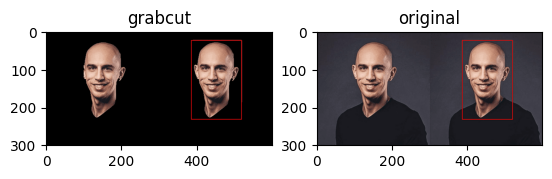

CPU times: user 325 ms, sys: 127 ms, total: 452 ms
Wall time: 327 ms


In [11]:
%%time
plt.subplot(121)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title("grabcut")

plt.subplot(122)
plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
plt.title("original")

plt.show()

## Using ipywidgets

Finally, you an use an ipywidget to display the image. You will need to convert the image from an array to bytes.

ipywidgets are great to use for displaying images and videos remotely within a Jupyter Notebook.

In the code below, we are displaying the original image of the statue that we read in using the CV2 in the previous code block.

In [12]:
%%time
import ipywidgets
from IPython.display import display

def bgr8_to_jpeg(value, quality=75):
    return bytes(cv2.imencode('.jpg', value)[1])

image_widget = ipywidgets.Image(format='jpeg')

image_widget.value = bgr8_to_jpeg(original)

display(image_widget)

Image(value=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\x02\x01\x0…

CPU times: user 56.3 ms, sys: 6.28 ms, total: 62.6 ms
Wall time: 82.6 ms


### PyCuda
Up until now, all of the image processing has used the CPU.  Let's look at how can process images on the GPU using PyCuda
Here we will convert a color tif image to black and white.

Let's import our pycuda libraries.
We will use openCv to read in the image and ipywidgets to display the images

In [13]:
!pip install pycuda

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 18.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.4/87.4 kB 13.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 13.4 MB/s eta 0:00:00
  Created wheel for pycuda: filename=pycuda-2024.1-cp310-cp310-linux_x86_64.whl size=661204 sha256=8663f5d0e1a7a85d443ceca45a7d33a4b29f33604009e6e3689e192f7fb5c9e2
  Stored in directory: /root/.cache/pip/wheels/12/34/d2/9a349255a4eca3a486d82c79d21e138ce2ccd90f414d9d72b8
Successfully built pycuda


In [14]:
pip install pycuda drv

  Preparing metadata (setup.py) ... done
  Created wheel for drv: filename=DRV-0.1.2.dev0-py3-none-any.whl size=13839 sha256=58adc16c847a50443d89c043874edd31bcd2eb380440caf9507381465933b38d
  Stored in directory: /root/.cache/pip/wheels/17/b7/ba/b5f9c3a8ed8a6688dadacf490ef11925b92a22e8472a3f5f0d
Successfully built drv


In [15]:
import pycuda.driver as drv
import pycuda.autoinit
from pycuda.compiler import SourceModule
import numpy as np
import cv2
import ipywidgets
from IPython.display import display

#convert image to jpg for display
def bgr8_to_jpeg(value, quality=75):
    return bytes(cv2.imencode('.jpg', value)[1])

Now lets take an image and pass it to the GPU and perform the computation to convert the image to black and white

In [16]:
%%time
# -*- coding: utf-8 -*-
"""
Created on Mon Aug 13 12:15:39 2018

@author: bhaumik
"""

#pass c code to perform work on GPU

mod = SourceModule \
    (
        '''
#include<stdio.h>
#define INDEX(a, b) a*256+b

__global__ void bgr2gray(float *d_result,float *b_img, float *g_img, float *r_img)
{
unsigned int idx = threadIdx.x+(blockIdx.x*(blockDim.x*blockDim.y));

unsigned int a = idx/256;
unsigned int b = idx%256;
d_result[INDEX(a, b)] = (0.299*r_img[INDEX(a, b)]+0.587*g_img[INDEX(a, b)]+0.114*b_img[INDEX(a, b)]);

}

  '''
      )

h_img = cv2.imread('/content/drive/My Drive/instructions/lena_color.tif',1)


b_img = h_img[:, :, 0].reshape(65536).astype(np.float32)
g_img = h_img[:, :, 1].reshape(65536).astype(np.float32)
r_img = h_img[:, :, 2].reshape(65536).astype(np.float32)

h_result=r_img
#create instance of cuda function
bgr2gray = mod.get_function("bgr2gray")
#call pycuda function
bgr2gray(drv.Out(h_result), drv.In(b_img), drv.In(g_img),drv.In(r_img),block=(1024, 1, 1), grid=(64, 1, 1))

h_result=np.reshape(h_result,(256,256)).astype(np.uint8)
#display transformed image
image_widget = ipywidgets.Image(format='jpeg')
image_widget.value = bgr8_to_jpeg(h_result)
display(image_widget)
#original image
orgimage_widget = ipywidgets.Image(format='jpeg')
orgimage_widget.value = bgr8_to_jpeg(h_img)
display(orgimage_widget)

Image(value=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\x02\x01\x0…

Image(value=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\x02\x01\x0…

CPU times: user 35.2 ms, sys: 10.2 ms, total: 45.4 ms
Wall time: 2.43 s


In [17]:
%%time
image_widget = ipywidgets.Image(format='jpeg')

image_widget.value = bgr8_to_jpeg(h_img)

display(image_widget)

Image(value=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\x02\x01\x0…

CPU times: user 8.22 ms, sys: 13 µs, total: 8.23 ms
Wall time: 8.46 ms


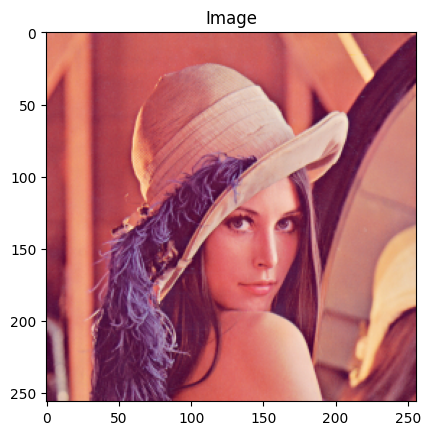

CPU times: user 290 ms, sys: 105 ms, total: 396 ms
Wall time: 278 ms


In [18]:
%%time
plt.imshow(cv2.cvtColor(h_img, cv2.COLOR_BGR2RGB))
plt.title("Image")
plt.show()

In [19]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Pycuda adding two images
Lets take the Lena image and combine with another image into one image

In [20]:
%%time
# -*- coding: utf-8 -*-
"""
Created on Mon Aug 13 12:15:39 2018

@author: bhaumik
"""


mod = SourceModule \
    (
        """

__global__ void add_num(float *d_result, float *d_a, float *d_b,int N)
{
 int tid = threadIdx.x + blockIdx.x * blockDim.x;
	while (tid < N)
    {
 d_result[tid] = d_a[tid] + d_b[tid];
 if(d_result[tid]>255)
 {
 d_result[tid]=255;
 }
 tid = tid + blockDim.x * gridDim.x;
}
    }

  """
      )

img1 = cv2.imread('/content/drive/My Drive/instructions/lena_color.tif',0)
img2 = cv2.imread('/content/drive/My Drive/instructions/circles.png',0)

#print a
h_img1 = img1.reshape(65536).astype(np.float32)
h_img2 = img2.reshape(65536).astype(np.float32)
N = h_img1.size
h_result=h_img1
add_img = mod.get_function("add_num")
add_img(drv.Out(h_result), drv.In(h_img1), drv.In(h_img2),np.uint32(N),block=(1024, 1, 1), grid=(64, 1, 1))

h_result=np.reshape(h_result,(256,256)).astype(np.uint8)

image_widget = ipywidgets.Image(format='jpeg')
image_widget.value = bgr8_to_jpeg(h_result)
display(image_widget)


Image(value=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\x02\x01\x0…

CPU times: user 17.5 ms, sys: 2.09 ms, total: 19.6 ms
Wall time: 1.15 s


### OpenCV CUDA

OpenCV has some libaries that are CUDA enabled. There are reference guides and document but not yet a lot of specific examples in Python.  Most are in C.  For those libraries that are available to OpenCV CUDA and Python, using those libraries are very similar to Open CV in python except that you prefix with 'CUDA.'  There are also several processing steps to prepare the data and move the data from CPU to GPU.

Let's look at a simple example of using the CLAHE transformation in OpenCV. This first example is the CPU version.

CPU times: user 20.2 ms, sys: 1.86 ms, total: 22.1 ms
Wall time: 35.1 ms


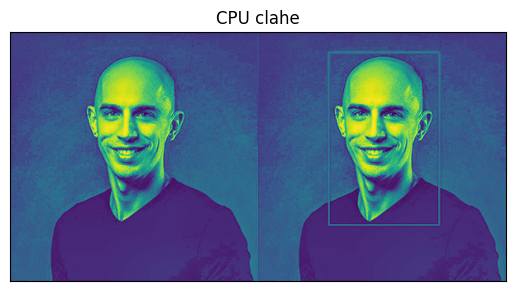

In [21]:
%%time
#CPU version
img = cv2.imread("/content/drive/My Drive/instructions/download.jpeg", cv2.IMREAD_GRAYSCALE)

def plotImages(imgr):
    plt.imshow(imgr)
    plt.title("CPU clahe")
    plt.xticks([])
    plt.yticks([])



#contrast Limited Adaptive Histogram Equalization
clahe = cv2.createCLAHE(clipLimit=5.0, tileGridSize=(8, 8))
imgr = clahe.apply(img)

plotImages(imgr)


###OpenCV CUDA

Now let us look at the CUDA version of the CLAHE function.  
Notice that you first much format the data using cuda_GpuMat and then upload the dat to the GPU.

Then you call the CLAHE function prefixing it with cuda. The final step before displaying the image is to download the image back to the CPU.

**step-by-step to build OpenCV with CUDA support in Google Colab:**

Install Required Dependencies:

In [22]:
!apt-get update
!apt-get install -y build-essential cmake git unzip pkg-config
!apt-get install -y libjpeg-dev libpng-dev libtiff-dev
!apt-get install -y libavcodec-dev libavformat-dev libswscale-dev
!apt-get install -y libv4l-dev libxvidcore-dev libx264-dev
!apt-get install -y libgtk-3-dev
!apt-get install -y libatlas-base-dev gfortran
!apt-get install -y python3-dev


Hit:1 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Get:2 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,626 B]
Get:3 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Hit:4 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:5 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Hit:6 https://ppa.launchpadcontent.net/c2d4u.team/c2d4u4.0+/ubuntu jammy InRelease
Get:7 http://security.ubuntu.com/ubuntu jammy-security/main amd64 Packages [1,858 kB]
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Get:9 http://archive.ubuntu.com/ubuntu jammy-backports InRelease [127 kB]
Get:10 http://archive.ubuntu.com/ubuntu jammy-updates/universe amd64 Packages [1,377 kB]
Get:11 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease [24.3 kB]
Hit:12 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Get:13 http://security.ubuntu.com/ubuntu j

Clone OpenCV and OpenCV Contrib Repositories:

In [23]:
!git clone https://github.com/opencv/opencv.git
!git clone https://github.com/opencv/opencv_contrib.git


Cloning into 'opencv'...
remote: Enumerating objects: 332278, done.
remote: Counting objects: 100% (1038/1038), done.
remote: Compressing objects: 100% (709/709), done.
remote: Total 332278 (delta 462), reused 706 (delta 310), pack-reused 331240
Receiving objects: 100% (332278/332278), 523.44 MiB | 25.32 MiB/s, done.
Resolving deltas: 100% (231537/231537), done.
Updating files: 100% (7500/7500), done.
Cloning into 'opencv_contrib'...
remote: Enumerating objects: 41264, done.
remote: Counting objects: 100% (1031/1031), done.
remote: Compressing objects: 100% (757/757), done.
remote: Total 41264 (delta 343), reused 754 (delta 217), pack-reused 40233
Receiving objects: 100% (41264/41264), 149.81 MiB | 15.31 MiB/s, done.
Resolving deltas: 100% (25466/25466), done.


Configure the Build with CMake:

In [24]:
!mkdir -p opencv/build
!cd opencv/build && cmake -D CMAKE_BUILD_TYPE=RELEASE \
                          -D CMAKE_INSTALL_PREFIX=/usr/local \
                          -D INSTALL_C_EXAMPLES=OFF \
                          -D INSTALL_PYTHON_EXAMPLES=OFF \
                          -D OPENCV_GENERATE_PKGCONFIG=ON \
                          -D OPENCV_EXTRA_MODULES_PATH=../../opencv_contrib/modules \
                          -D BUILD_EXAMPLES=OFF \
                          -D WITH_CUDA=ON \
                          -D ENABLE_FAST_MATH=1 \
                          -D CUDA_FAST_MATH=1 \
                          -D WITH_CUBLAS=1 \
                          -D WITH_V4L=ON \
                          -D WITH_QT=OFF \
                          -D WITH_OPENGL=ON ..


-- The CXX compiler identification is GNU 11.4.0
-- The C compiler identification is GNU 11.4.0
-- Detecting CXX compiler ABI info
-- Detecting CXX compiler ABI info - done
-- Check for working CXX compiler: /usr/bin/c++ - skipped
-- Detecting CXX compile features
-- Detecting CXX compile features - done
-- Detecting C compiler ABI info
-- Detecting C compiler ABI info - done
-- Check for working C compiler: /usr/bin/cc - skipped
-- Detecting C compile features
-- Detecting C compile features - done
-- Detected processor: x86_64
-- Found PythonInterp: /usr/bin/python3 (found suitable version "3.10.12", minimum required is "3.2") 
-- Found PythonLibs: /usr/lib/x86_64-linux-gnu/libpython3.10.so (found suitable exact version "3.10.12") 
-- Looking for ccache - not found
-- Performing Test HAVE_CXX_FSIGNED_CHAR
-- Performing Test HAVE_CXX_FSIGNED_CHAR - Success
-- Performing Test HAVE_C_FSIGNED_CHAR
-- Performing Test HAVE_C_FSIGNED_CHAR - Success
-- Performing Test HAVE_CXX_FFAST_MATH
-- 

Compile and Install OpenCV:

In [ ]:
!cd opencv/build && make -j$(nproc)
!cd opencv/build && make install
!ldconfig


[  0%] Built target opencv_highgui_plugins
[  0%] Built target opencv_dnn_plugins
[  0%] Generate opencv4.pc
CMake Deprecation Warning at /content/opencv/cmake/OpenCVGenPkgconfig.cmake:113 (cmake_minimum_required):
  Compatibility with CMake < 3.5 will be removed from a future version of
  CMake.

  Update the VERSION argument <min> value or use a ...<max> suffix to tell
  CMake that the project does not need compatibility with older versions.


[  0%] Built target gen-pkgconfig
[  0%] Built target opencv_videoio_plugins
[  0%] Building C object 3rdparty/ippiw/CMakeFiles/ippiw.dir/src/iw_core.c.o
[  0%] Building C object 3rdparty/ittnotify/CMakeFiles/ittnotify.dir/src/ittnotify/ittnotify_static.c.o
[  0%] Building C object 3rdparty/ippiw/CMakeFiles/ippiw.dir/src/iw_image.c.o
[  0%] Building C object 3rdparty/ippiw/CMakeFiles/ippiw.dir/src/iw_image_color_convert_all.c.o
[  0%] Building C object 3rdparty/ippiw/CMakeFiles/ippiw.dir/src/iw_image_color_convert_rgbs.c.o
[  0%] Building C obj

Verifying the Installation:


In [1]:
import cv2
print(cv2.getBuildInformation())


General configuration for OpenCV 4.8.0 =====================================
  Version control:               4.8.0-dirty

  Extra modules:
    Location (extra):            /io/opencv_contrib/modules
    Version control (extra):     4.8.0

  Platform:
    Timestamp:                   2023-08-09T11:58:06Z
    Host:                        Linux 5.15.0-1042-azure x86_64
    CMake:                       3.27.1
    CMake generator:             Unix Makefiles
    CMake build tool:            /bin/gmake
    Configuration:               Release

  CPU/HW features:
    Baseline:                    SSE SSE2 SSE3
      requested:                 SSE3
    Dispatched code generation:  SSE4_1 SSE4_2 FP16 AVX AVX2 AVX512_SKX
      requested:                 SSE4_1 SSE4_2 AVX FP16 AVX2 AVX512_SKX
      SSE4_1 (16 files):         + SSSE3 SSE4_1
      SSE4_2 (1 files):          + SSSE3 SSE4_1 POPCNT SSE4_2
      FP16 (0 files):            + SSSE3 SSE4_1 POPCNT SSE4_2 FP16 AVX
      AVX (7 files):      

In [ ]:
# Step 1: Uninstall the existing OpenCV
!pip uninstall -y opencv-python opencv-python-headless opencv-contrib-python

# Step 2: Install dependencies
!apt-get update
!apt-get install -y build-essential cmake git pkg-config libgtk-3-dev \
    libavcodec-dev libavformat-dev libswscale-dev libv4l-dev \
    libxvidcore-dev libx264-dev libjpeg-dev libpng-dev libtiff-dev \
    gfortran openexr libatlas-base-dev python3-dev python3-numpy \
    libtbb2 libtbb-dev libdc1394-22-dev libopenexr-dev libgstreamer-plugins-base1.0-dev \
    libgstreamer1.0-dev

# Step 3: Clone the OpenCV and OpenCV contrib repositories
!git clone https://github.com/opencv/opencv.git
!git clone https://github.com/opencv/opencv_contrib.git

# Step 4: Create a build directory and navigate into it
!mkdir -p opencv/build
%cd opencv/build

# Step 5: Configure the build with CMake
!cmake -D CMAKE_BUILD_TYPE=RELEASE \
    -D CMAKE_INSTALL_PREFIX=/usr/local \
    -D OPENCV_EXTRA_MODULES_PATH=../../opencv_contrib/modules \
    -D ENABLE_FAST_MATH=1 \
    -D CUDA_FAST_MATH=1 \
    -D WITH_CUDA=ON \
    -D BUILD_opencv_cudacodec=ON \
    -D WITH_CUDNN=ON \
    -D OPENCV_DNN_CUDA=ON \
    -D OPENCV_ENABLE_NONFREE=ON \
    -D WITH_GSTREAMER=ON \
    -D WITH_TBB=ON \
    -D BUILD_EXAMPLES=OFF ..

# Step 6: Compile OpenCV (this step might take some time)
!make -j8

# Step 7: Install the compiled OpenCV
!make install
!ldconfig

# Step 8: Verify the installation
!pkg-config --modversion opencv4


Found existing installation: opencv-python 4.8.0.76
Uninstalling opencv-python-4.8.0.76:
  Successfully uninstalled opencv-python-4.8.0.76
Found existing installation: opencv-python-headless 4.9.0.80
Uninstalling opencv-python-headless-4.9.0.80:
  Successfully uninstalled opencv-python-headless-4.9.0.80
Found existing installation: opencv-contrib-python 4.8.0.76
Uninstalling opencv-contrib-python-4.8.0.76:
  Successfully uninstalled opencv-contrib-python-4.8.0.76
Get:1 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Hit:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:3 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:4 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:5 http://security.ubuntu.com/ubuntu jammy-security/main amd64 Packages [1,858 kB]
Hit:6 https://ppa.launchpadcontent.net/c2d4u.team/c2d4u4.0+/ubuntu jammy InRelease
Get:7 http://security.ubuntu.com/ubuntu jammy-security/universe amd64 

In [2]:
#reference https://learnopencv.com/getting-started-opencv-cuda-module/

def plotImages(img):
    plt.imshow(img)
    plt.title("cuda clahe")
    plt.xticks([])
    plt.yticks([])

img = cv2.imread("/content/drive/My Drive/instructions/download.jpeg", cv2.IMREAD_GRAYSCALE)
src = cv2.cuda_GpuMat()
src.upload(img)

clahe = cv2.cuda.createCLAHE(clipLimit=5.0, tileGridSize=(8, 8))
dst = clahe.apply(src, cv2.cuda_Stream.Null())

result = dst.download()

plotImages(img)

error: OpenCV(4.8.0) /io/opencv/modules/core/include/opencv2/core/private.cuda.hpp:106: error: (-216:No CUDA support) The library is compiled without CUDA support in function 'throw_no_cuda'


In [ ]:
!pip install cupy-cuda11x  # Replace `11x` with the appropriate CUDA version

In [ ]:
!pip uninstall -y cupy-cuda12x cupy

In [ ]:
%%time

import cv2
import cupy as cp
from matplotlib import pyplot as plt

# Load the image using OpenCV (cv2)
image_path = '/content/drive/My Drive/instructions/download.jpeg'
img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Convert the image to a CuPy array
img_gpu = cp.array(img)

# Perform the CLAHE operation on the GPU using a custom implementation
def clahe_gpu(image, clip_limit=5.0, tile_grid_size=(8, 8)):
    # Create CLAHE object on CPU
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    # Apply CLAHE on CPU and transfer the result back to GPU
    return cp.array(clahe.apply(cp.asnumpy(image)))

# Apply CLAHE on the GPU
img_clahe_gpu = clahe_gpu(img_gpu)

# Display the result
plt.imshow(cp.asnumpy(img_clahe_gpu), cmap='gray')
plt.axis('off')
plt.show()


In [ ]:
import IPython
app = IPython.Application.instance()
app.kernel.do_shutdown(True)

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Define function to plot images
def plotImages(img):
    plt.imshow(img, cmap='gray')
    plt.title("CUDA CLAHE")
    plt.xticks([])
    plt.yticks([])
    plt.show()

# Load the image from Google Drive
image_path = '/content/drive/My Drive/instructions/download.jpeg'
img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Upload image to GPU
src = cv2.cuda_GpuMat()
src.upload(img)

# Create CLAHE object for GPU
clahe = cv2.cuda.createCLAHE(clipLimit=5.0, tileGridSize=(8, 8))

# Start the timer
start = cv2.cuda_Event()
end = cv2.cuda_Event()
start.record()

# Apply CLAHE on GPU
dst = clahe.apply(src, cv2.cuda_Stream.Null())

# Stop the timer
end.record()
end.synchronize()

# Calculate elapsed time in milliseconds
time_elapsed = cv2.cuda.getTickCount() - start.getTickCount()
time_elapsed_ms = time_elapsed / cv2.cuda.getTickFrequency() * 1000
print(f'Time elapsed for GPU processing: {time_elapsed_ms} ms')

# Download result back to CPU
result = dst.download()

# Plot the result
plotImages(result)
